**Atenção: Devido a natureza dos dados, para correto funcionamento, este notebook precisa ser executado em ambiente com memória RAM maior ou igual a 25 Gb.**

#**Ciência e Visualização de Dados**
##**Projeto Final - Entrega 02**
###Alunos: 
###Gleyson Roberto do Nascimento. RA: 043801. Elétrica.
###Negli René Gallardo Alvarado. RA: 234066. Saúde.
###Rafael Vinícius da Silveira. RA: 137382. Física.
###Sérgio Sevileanu. RA: 941095. Elétrica.



##Neste notebook do Google Colaboratory será realzada a análise estatística do Estado da Bahia durante os anos de 2008 a 2018 segundo o banco de dados [SIHSUS](https://bigdata-metadados.icict.fiocruz.br/dataset/sistema-de-informacoes-hospitalares-do-sus-sihsus/resource/ae85ac54-6734-43b8-a820-6129a854e1ff).

##Desta forma, algumas definições iniciais e um disclaimer se fazem necessários para este projeto:

##Será definido como **diagnóstico correto** aquele em que houve apenas um diagnóstico de CID10, sem alterações durante o período até a alta;  
##Será definido como **diagnóstico equivocado** aquele em que houve mais de um diagnóstico de CID10, contudo, eles fazem parte do mesmo grupo, de forma que é plausível o equívoco dada a semelhança de sintomas entre os CID10;
##Será definido como **falha de diagnóstico** aquele em que houve mais de um diagnóstico de CID10, contudo, eles fazem parte de grupos distintos, de forma que embora possam existir sintomas semelhantes entre os CID10, caberia ao profissional uma análise mais aprofundada antes do diagnóstico.
##**Disclaimer**: Considerando a natureza do banco de dados do SIHSUS, isto é, um Big Data em que inúmeros funcionários do Sistema Único de Saúde possuem acesso e inserem os dados de forma manual em realdades e condições bastante distintas, existe a séria possibildade de erro sistemático, desta forma, a acurácia deste trabalho deve ser considerada com ressalvas.

##Instalando e Importando as Bibliotecas Necessárias.

In [ ]:
!pip install dask[complete]
!pip install -U -q PyDrive

In [ ]:
%load_ext google.colab.data_table
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pickle
import dask
from dask import dataframe as dd
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from google.colab import files
from oauth2client.client import GoogleCredentials
pd.set_option('display.max_columns', None)
pd.options.display.precision = 2
pd.options.display.max_rows = 50
import seaborn as sns
import missingno as msno
import matplotlib as mpl
from matplotlib import rcParams
mpl.rc('figure', max_open_warning = 0)
import statsmodels.api as sm
from statsmodels.api import graphics
import statsmodels.formula.api as smf
import statsmodels.stats.multicomp as multi
from scipy.stats import pearsonr
from scipy.stats import spearmanr
pd.set_option('display.max_columns', None)
import itertools
import sklearn
from sklearn.metrics import mean_squared_error
from sklearn.metrics import classification_report
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings("ignore")

##Fazendo Autenticação do Gooogle Drive, Baixando os Arquivos e Criando Dataframes.

##O dicionário de Variáveis para os arquivos se econtra no [GitHub](https://github.com/grnbatera/Data4health/blob/main/assets/Dicion%C3%A1rio%20de%20Vari%C3%A1veis.csv) 



In [ ]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [ ]:
ids = ['1Hdzz218LvSzz_reDjndKZ2a6r_M_zKl-','1LcqDxhUAIwVEsMEcrfAAQGjoQvCD8qGn','19zx0YYD10ddYYGGk5BOwKcvLSlyE0DcQ','1vffaXC_qag8_dwf49xDPL7CctAxZ6_x-','16g9O_wwsowh5V6CHNRWxnpA1rQtxZX7G']
estados = ['SP','BA','PR','PA','GO']
arquivo = ['sp.pkl','ba.pkl','pr.pkl','pa.pkl','go.pkl']

In [ ]:
dflist=[]
for i in range (len(ids)):
  fileDownloaded = drive.CreateFile({'id':ids[i]})
  fileDownloaded.GetContentFile(arquivo[i])
  globals()[estados[i]] = pd.read_pickle(arquivo[i])
  globals()[estados[i]] = (globals()[estados[i]]).reset_index(drop=True)
  dflist.append(eval(estados[i]))

###Baixando arquivo com Valores Anuais de Custo por Internação e Atendimento e fazendo o merge com o arquivo principal do SIHSUS.

In [ ]:
fileDownloaded = drive.CreateFile({'id':'1corB_xGrJ3NDFpIXuKDl6Dri_tlPLzI0'})
fileDownloaded.GetContentFile('anual.xlsx')
anual = pd.read_excel('anual.xlsx',sheet_name='anual')

In [ ]:
anual['cep'] = [i[0] for i in anual.v241.str.split(' ').values]

In [ ]:
anual['cep']=anual['cep'].astype('int64')
anual.columns = ['v1',	'v241',	'v242',	'v243',	'v244',	'v245',	'v246',	'v247',	'v248',	'v249',	'v250',	'v251',	'v252','v0']

In [ ]:
full = pd.merge(BA,anual, on=['v0','v1'],how='left')

In [ ]:
full

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v249,v250,v251,v252
0,290000,2008,12,3,7.35e+13,2908109681950,APAC Normal,2908109681950,1,Normal,47400000,293360,29,19870417,1,Masculino,0,0,0,0,Não utilizou UTI,0,0,2,303010061,303010061,285.40,39.50,324.90,0.0,140.64,20081210,20081212,A049,NaN,12,Alta melhorado,20,NaN,NaN,2,Estadual plena,0,Não,293360,29,4,Anos,21,2,2,0,Sem óbito,10,2,2,0,Não,0,Sem filhos/Não inform,0,NaN,0,0,1,Sim,0,0,Seqüencial zerado,0,0,0,NaN,0,0,2526379,NaN,NaN,NaN,2,Média complexidade,6,Média e Alta Complexidade (MAC),0,Sem regra contratual,3,Parda,NaN,18980,HE29000001N200812.DTS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,293360,Xique-Xique,XIQUE-XIQUE,N,N,N,29,2901,2921,29013,-10.82,-42.73,402.0,5671.44,293360,293360,Xique-Xique,XIQUE-XIQUE,N,N,N,29,2901,2921,29013,-10.82,-42.73,402,5671.44,293360,BA,29,BAHIA,BA,BAHIA,Região Nordeste,Região Nordeste,Bahia,BA,Bahia,BA,Xique-Xique,Xique-Xique,NaN,NaN,Irecê,Irecê,NaN,NaN,Vale S.Francisco,Vale S.Francisco,Barra,Irecê,Irecê,Irecê,Irecê,NaN,Brasil,Não Informado,Clínico,TRATAMENTO DE DOENÇAS INFECCIOSAS E INTESTINAIS,TRATAMENTO DE DOENÇAS INFECCIOSAS E INTESTINAIS,21,15-49a,15-24a,20-24a,Capítulo I - Algumas doenças infecciosas e par...,Doenças infecciosas intestinais,Outras infecções intestinais bacterianas,Infecção intestinal bacteriana não especificada,NaN,NaN,NaN,NaN,2008,qua,2008,sex,21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,290000,2008,12,3,7.35e+13,2908109682050,APAC Normal,2908109682050,1,Normal,47400000,293360,29,19761004,1,Masculino,0,0,0,0,Não utilizou UTI,0,0,3,303010061,303010061,285.40,39.50,324.90,0.0,140.64,20081206,20081209,A049,NaN,16,Alta por evasão,20,NaN,NaN,2,Estadual plena,0,Não,293360,29,4,Anos,32,3,3,0,Sem óbito,10,2,2,0,Não,0,Sem filhos/Não inform,0,NaN,0,0,1,Sim,0,0,Seqüencial zerado,0,0,0,NaN,0,0,2526379,NaN,NaN,NaN,2,Média complexidade,6,Média e Alta Complexidade (MAC),0,Sem regra contratual,3,Parda,NaN,18981,HE29000001N200812.DTS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,293360,Xique-Xique,XIQUE-XIQUE,N,N,N,29,2901,2921,29013,-10.82,-42.73,402.0,5671.44,293360,293360,Xique-Xique,XIQUE-XIQUE,N,N,N,29,2901,2921,29013,-10.82,-42.73,402,5671.44,293360,BA,29,BAHIA,BA,BAHIA,Região Nordeste,Região Nordeste,Bahia,BA,Bahia,BA,Xique-Xique,Xique-Xique,NaN,NaN,Irecê,Irecê,NaN,NaN,Vale S.Francisco,Vale S.Francisco,Barra,Irecê,Irecê,Irecê,Irecê,NaN,Brasil,Não Informado,Clínico,TRATAMENTO DE DOENÇAS INFECCIOSAS E INTESTINAIS,TRATAMENTO DE DOENÇAS INFECCIOSAS E INTESTINAIS,32,15-49a,25-34a,30-34a,Capítulo I - Algumas doenças infecciosas e par...,Doenças infecciosas intestinais,Outras infecções intestinais bacterianas,Infecção intestinal bacteriana não especificada,NaN,NaN,NaN,NaN,2008,sab,2008,ter,32,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,290000,2008,12,3,7.35e+13,2908109682258,APAC Normal,2908109682258,1,Normal,47450000,291130,29,19781019,3,Feminino,0,0,0,0,Não utilizou UTI,0,0,2,303140151,303140151,504.07,78.35,582.42,0.0,252.12,20081210,20081212,J158,NaN,12,Alta melhorado,20,NaN,NaN,2,Estadual plena,0,Não,293360,29,4,Anos,30,2,2,0,Sem óbi

In [ ]:
full = full.drop('v249', axis = 1)

###Fazendo o download do arquivo intermediário 1 em pickle para evitar retrabalho caso o Colab dê problema de RAM. 

In [ ]:
with open('full.pkl','wb') as f:
  pickle.dump(full,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
from google.colab import files
files.download('full.pkl')

##Fazendo o tratamento do banco.

###Fazendo uma análise das variáveis para verificar se são numéricas ou categóricas, verificar o tipo e a quantidade de itens únicos por variável.

In [ ]:
draw={}
categoricon = []
categoricost = []
notcategorical = []
k=1
print('\033[1m'+'Valores únicos de '+ estados[k]+'\033[0m')
for col in full:
  draw[col] = full[col].unique()
  print('Variavel: ',col,' | Tipo da Variável: ',full[col].dtypes,' | Quantidade de itens: ',len(draw[col]))
  if full[col].dtypes != 'object' and len(draw[col]) < 5000:
    categoricon.append(col)
  elif full[col].dtypes != 'object' and len(draw[col]) > 5000:
    notcategorical.append(col)
  else:
    categoricost.append(col)    
print('\n')

Valores únicos de BA
Variavel:  v0  | Tipo da Variável:  int64  | Quantidade de itens:  112
Variavel:  v1  | Tipo da Variável:  int64  | Quantidade de itens:  11
Variavel:  v2  | Tipo da Variável:  int64  | Quantidade de itens:  1
Variavel:  v3  | Tipo da Variável:  int64  | Quantidade de itens:  12
Variavel:  v4  | Tipo da Variável:  float64  | Quantidade de itens:  292
Variavel:  v5  | Tipo da Variável:  int64  | Quantidade de itens:  717928
Variavel:  v6  | Tipo da Variável:  object  | Quantidade de itens:  1
Variavel:  v7  | Tipo da Variável:  int64  | Quantidade de itens:  717928
Variavel:  v8  | Tipo da Variável:  int64  | Quantidade de itens:  2
Variavel:  v9  | Tipo da Variável:  object  | Quantidade de itens:  2
Variavel:  v10  | Tipo da Variável:  int64  | Quantidade de itens:  31301
Variavel:  v11  | Tipo da Variável:  int64  | Quantidade de itens:  1143
Variavel:  v12  | Tipo da Variável:  int64  | Quantidade de itens:  27
Variavel:  v13  | Tipo da Variável:  int64  | Quant

###Substituindo valores de Missing para tratamento de categorias.

In [ ]:
full[categoricon] = (full[categoricon]).fillna(99999)
full[categoricost] = (full[categoricost]).fillna('a99999')
full[notcategorical] = (full[notcategorical]).fillna('a99999')
full[['v248','v250','v251','v252']]=full[['v248','v250','v251','v252']].replace('a99999',9.99999)
full[['v243']]=full[['v243']].replace('a99999',99999)

In [ ]:
full2=full.copy()

###Criando categorias numéricas para as variáveis do tipo string.

In [ ]:
for i in range(len(categoricost)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[categoricost[i]])
  full2[categoricost[i]]=le.transform(full2[categoricost[i]])
  print('As categorias de', categoricost[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[categoricost[i]].unique()))

As categorias de v6 eram: ['APAC Normal'] e mudaram para: [0]
As categorias de v9 eram: ['Longa permanência' 'Normal'] e mudaram para: [0, 1]
As categorias de v15 eram: ['Feminino' 'Masculino'] e mudaram para: [0, 1]
As categorias de v23 eram: ['Não utilizou UTI' 'UTI Doador' 'UTI adulto - tipo I'
 'UTI adulto - tipo II' 'UTI adulto - tipo III'
 'UTI coronariana tipo II - UCO tipo II' 'UTI infantil - tipo II'
 'UTI infantil - tipo III' 'UTI neonatal - tipo II'
 'Utilizou mais de um tipo de UTI'] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
As categorias de v48 eram: ['A000' 'A001' 'A009' ... 'Z948' 'Z980' 'Z988'] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92

###Criando categorias numéricas para as variáveis do tipo numérico.

In [ ]:
for i in range(len(categoricon)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[categoricon[i]])
  full2[categoricon[i]]=le.transform(full2[categoricon[i]])
  print('As categorias de', categoricon[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[categoricon[i]].unique()))

As categorias de v0 eram: [290000 290020 290070 290100 290210 290290 290320 290350 290390 290410
 290460 290500 290520 290570 290630 290650 290680 290685 290687 290710
 290750 290780 290800 290830 290850 290910 290960 290980 291005 291050
 291070 291072 291080 291085 291120 291170 291190 291200 291210 291290
 291360 291370 291400 291450 291460 291465 291470 291480 291490 291560
 291640 291650 291685 291700 291750 291760 291770 291800 291810 291840
 291880 291920 291950 291955 291980 291992 292050 292100 292110 292150
 292170 292200 292230 292265 292290 292300 292360 292400 292460 292520
 292525 292530 292550 292580 292590 292700 292740 292770 292800 292810
 292860 292870 292880 292890 292900 292905 292910 292920 292950 292960
 292970 293000 293010 293020 293050 293070 293135 293190 293260 293320
 293330 293360] e mudaram para: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42

###Criando categorias numéricas para as variáveis com grande número de valores únicos.

In [ ]:
for i in range(len(notcategorical)):
  le = preprocessing.LabelEncoder()
  le.fit(full2[notcategorical[i]])
  full2[notcategorical[i]]=le.transform(full2[notcategorical[i]])
  print('As categorias de', notcategorical[i] , 'eram:' , le.classes_ , 'e mudaram para:' , sorted(full2[notcategorical[i]].unique()))

###Salvando este arquivo como final.

In [ ]:
with open('full2.pkl','wb') as f:
  pickle.dump(full2,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
files.download('full2.pkl')

###Fazendo a análise estatística para o arquivo final.

In [ ]:
full2.describe()

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v250,v251,v252
count,722631.00,722631.00,722631.0,722631.00,722631.00,722631.00,722631.0,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.0,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.0,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.0,722631.0,7.23e+05,7.23e+05,7.23e+05,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,7.23e+05,7.23e+05,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.0,722631.0,722631.00,722631.0,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.0,722631.00,722631.0,722631.0,722631.0,722631.00,722631.0,722631.0,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00,722631.00
mean,25.84,4.88,0.0,1.88,80.51,357924.63,0.0,357924.63,0.01,0.99,22261.51,568.42,14.98,22770.95,0.61,0.39,0.24,0.24,0.24,0.13,0.13,0.02,1.48,4.45,445.63,439.60,18406.35,4303.90,21818.79,3.07,20738.95,1387.69,1010.11,2595.42,1265.02,5.76,7.88,3.07,11.75,11.59,0.60,0.40,0.19,0.19,189.85,0.0,1.94,1.07,36.61,4.64,4.64,0.03,0.97,0.06,0.82,0.82,0.06,1.0,0.02,10.96,0.02,7.99,0.05,0.04,1.00,1.00,158.76,0.0,0.0,6.78e-05,4.15e-05,4.01e-05,10.66,0.11,8.77,234.89,260.88,328.74,808.56,1.04,0.96,0.97,0.97,0.26,3.44,3.13,3.74,4.41,15968.03,189.05,64.48,64.57,56.79,58.05,92.78,1.88,1.89,1341.60,2.01,1.95,1.96,1.96,1.30,1.30,1.30,0.65,0.65,0.65,568.42,596.77,605.67,1.85e-04,7.89e-05,0.17,14.98,20.94,110.57,40.38,569.75,700.21,202.73,708.77,568.42,189.85,187.74,189.71,0.0,0.0,0.24,0.0,2.87,9.93,13.88,154.49,197.55,90.76,185.29,189.85,4.10,0.0,4.10,0.0,0.0,0.0,1.00,0.0,0.0,4.10,4.10,187.74,596.78,3.50,45.78,14.92,196.12,2.54,44.82,2.95,65.24,209.75,17.91,145.29,14.93,93.18,5.02,9.11,8.00,3.12,955.87,988.30,36.39,1.73,3.66,7.41,9.39,116.94,677.05,2406.18,20.88,187.51,652.47,1330.50,6.87,3.17,4.88,3.06,36.61,92.53,655.93,655.95,274

###Fazendo o cálculo da Correlação e P-Valor das Variáveis.

In [ ]:
def pvalor(df,metodo):
    df = df.dropna()._get_numeric_data()
    dfcols = pd.DataFrame(columns=df.columns)
    pvalues = dfcols.transpose().join(dfcols, how='outer')
    if metodo == 'spearman':
      for r in df.columns:
        for c in df.columns:
          pvalues[r][c] = spearmanr(df[r], df[c])[1]
    else:
      for r in df.columns:
        for c in df.columns:
          pvalues[r][c] = pearsonr(df[r], df[c])[1]
    return pvalues

In [ ]:
cid_columns = ['v48','v49','v82','v104','v105']

In [ ]:
metodo = ['pearson','spearman']

In [ ]:
correlacao = []
p_valor = []
for i in range(len(metodo)):
  #Calculando as correlações por Pearson e Spearman e Imprimindo os Valores
  print('\033[1m' + 'Coeficientes de Correlação por '+ metodo[i] + '\033[0m')
  print('\n')
  k1 = full2.corr(method=metodo[i])
  correlacao.append(k1)
  print(correlacao[i])
  print('\n')

  #Calculando o p-valor por Pearson e Spearman e Imprimindo os Valores
  print('\033[1m' + 'P-valor por '+ metodo[i] + '\033[0m')
  print('\n')
  k2 = pvalor(full2,metodo[i])
  p_valor.append(k2)
  print(p_valor[i])
  print('\n')

Coeficientes de Correlação por pearson


        v0        v1  v2    v3        v4    v5  v6    v7        v8        v9  \
v0    1.00 -1.29e-01 NaN -0.08  1.52e-01 -0.14 NaN -0.14  2.64e-03 -2.64e-03   
v1   -0.13  1.00e+00 NaN -0.03  3.57e-03  0.99 NaN  0.99 -4.28e-03  4.28e-03   
v2     NaN       NaN NaN   NaN       NaN   NaN NaN   NaN       NaN       NaN   
v3   -0.08 -2.92e-02 NaN  1.00 -5.34e-02 -0.03 NaN -0.03  1.00e-01 -1.00e-01   
v4    0.15  3.57e-03 NaN -0.05  1.00e+00 -0.01 NaN -0.01  3.06e-02 -3.06e-02   
...    ...       ...  ..   ...       ...   ...  ..   ...       ...       ...   
v247 -0.36  1.06e-01 NaN  0.03  1.04e-01  0.09 NaN  0.09  3.27e-02 -3.27e-02   
v248  0.85 -1.28e-01 NaN -0.11  1.83e-01 -0.15 NaN -0.15  1.86e-02 -1.86e-02   
v250 -0.56  5.88e-02 NaN  0.07  5.43e-02  0.04 NaN  0.04  4.83e-02 -4.83e-02   
v251 -0.39  4.88e-02 NaN  0.05  9.36e-02  0.03 NaN  0.03  3.92e-02 -3.92e-02   
v252 -0.70  1.98e-01 NaN  0.07 -7.67e-02  0.20 NaN  0.20  1.13e-02 -1.13e-02   

###Fazendo o heatmap de Corrrelação para as variáves com CID10 definido.

In [ ]:
def corr_to_target(dataframe, target, title=None, file=None):
  plt.figure(figsize=(10,60))
  sns.set(font_scale=1)
  sns.heatmap(dataframe.corr(method = 'spearman')[[target]].sort_values(target,ascending=False)[1:],annot=True,cmap='coolwarm')
  if title: plt.title(f'\n{title}\n', fontsize=18)
  #plt.xlabel('') — # optional in case you want an x-axis Label
  #plt.ylabel('') # optional in case you want a y-axis Label
  if file: plt.savefig(file,bbox_inches='tight', format='png',dpi=600)
  plt.show();
  return

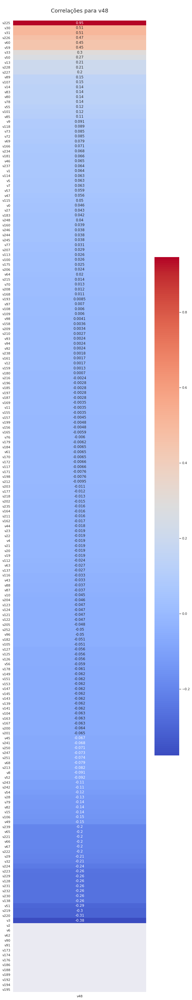

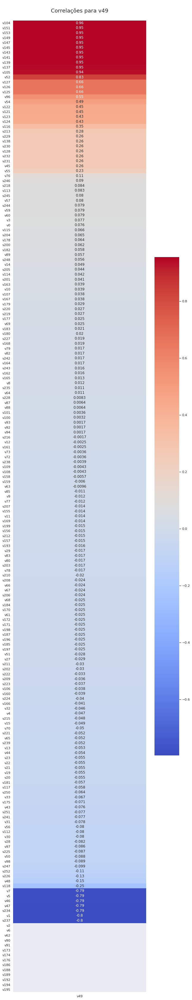

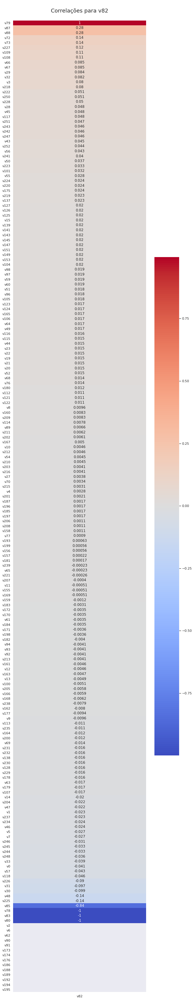

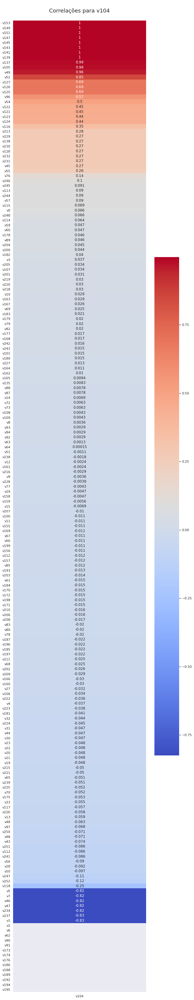

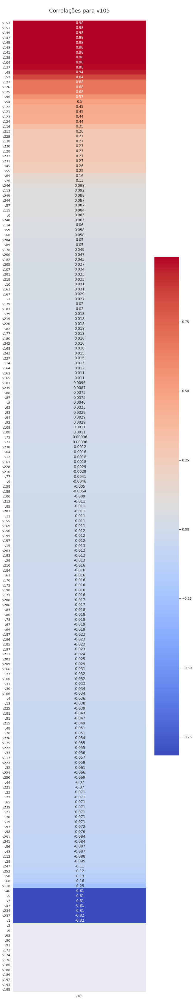

In [ ]:
for col in cid_columns:
  corr_to_target(full2,col,title = 'Correlações para '+ col, file='/content/drive/MyDrive/zica/correlacaoba'+col+'.png')

###Criando uma matriz com um string correspondente ao match de correlação e p-valor.

In [ ]:
def classecat(num):
  if abs(num) >= 0.7:
    return 'Correlação Forte'
  elif 0.5 <= abs(num) < 0.7:
    return 'Correlação Moderada'
  elif 0.3 <= abs(num) < 0.5:
    return 'Correlação Fraca'
  else:
    return 'Não há Correlação'

In [ ]:
def classepval(num):
  if abs(num) < 0.001:
    return 'Certeza Alta'
  elif 0.01 <= abs(num) < 0.05:
    return 'Certeza Moderada'
  elif 0.05 <= abs(num) < 0.1:
    return 'Certeza Fraca'
  else:
    return 'Nível de Certeza Ináceitável'

In [ ]:
relacoes = correlacao.copy()
for i in range(len(relacoes)):
  for col in relacoes[i]:
    (relacoes[i])[col] = (relacoes[i])[col].map(classecat)+ ' e '+ (p_valor[i])[col].map(classepval)

In [ ]:
relacoes[0]

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v250,v251,v252
v0,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Moderada,Não há Correlação e Certeza Moderada,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Fraca,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Forte e Certeza Alta,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Fraca e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Moderada,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Fraca,Não há Correlação e Certeza Fraca,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Moder

In [ ]:
relacoes[1]

,v0,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v19,v20,v21,v22,v23,v27,v28,v29,v30,v31,v32,v33,v43,v44,v45,v46,v47,v48,v49,v50,v51,v52,v54,v55,v56,v57,v59,v60,v61,v62,v63,v64,v65,v66,v67,v68,v69,v70,v72,v73,v76,v77,v78,v79,v80,v82,v83,v85,v87,v88,v89,v90,v91,v92,v93,v94,v96,v97,v98,v100,v101,v104,v105,v106,v107,v108,v109,v112,v113,v114,v115,v116,v117,v118,v121,v122,v123,v124,v125,v126,v127,v128,v137,v138,v139,v141,v143,v145,v147,v149,v151,v153,v155,v156,v157,v158,v159,v160,v161,v162,v163,v164,v165,v166,v167,v168,v169,v170,v171,v172,v173,v174,v175,v176,v177,v178,v179,v180,v181,v182,v183,v184,v185,v186,v187,v188,v189,v192,v193,v194,v195,v196,v197,v198,v199,v200,v201,v202,v203,v204,v205,v206,v207,v208,v209,v210,v211,v212,v213,v215,v216,v218,v219,v220,v221,v222,v223,v224,v225,v226,v227,v228,v229,v230,v231,v232,v234,v235,v237,v238,v239,v241,v242,v243,v244,v245,v246,v247,v248,v250,v251,v252
v0,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Correlação Forte e Certeza Alta,Correlação Forte e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Alta,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Nível de Certeza Ináceitável,Não há Correlação e Certeza Moderada,Não há Correlação e Certeza Moderada,Não há Correlação e Certeza Moderada,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não há Correlação e Certeza Alta,Não

###Salvando a matriz de correlações em pickle.

In [ ]:
with open('relacoes.pkl','wb') as f:
  pickle.dump(relacoes,f,pickle.HIGHEST_PROTOCOL)

In [ ]:
from google.colab import files
files.download('relacoes.pkl')

###Fazendo o scatterplot das variáveis de CID10 com as demais variáveis do banco para análise gráfica de correlação.

In [ ]:
z=sorted(np.unique(['v225','v151','v147','v143','v139','v137','v125','v7','v46','v237','v79','v78','v83','v153','v149','v145','v141','v105','v49','v127','v125','v5','v46','v47','v237','v153','v149','v145','v141','v104','v49','v127','v125','v46','v47','v1','v5']))

In [ ]:
x_vars = z
y_vars=cid_columns

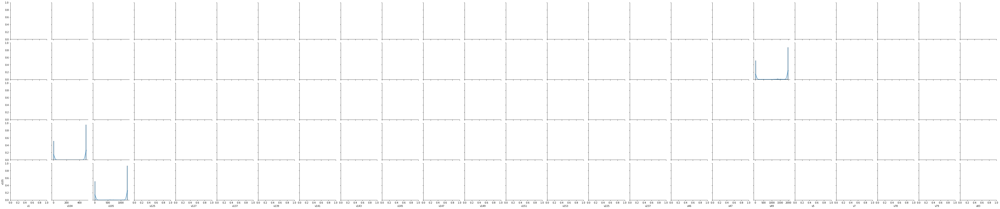

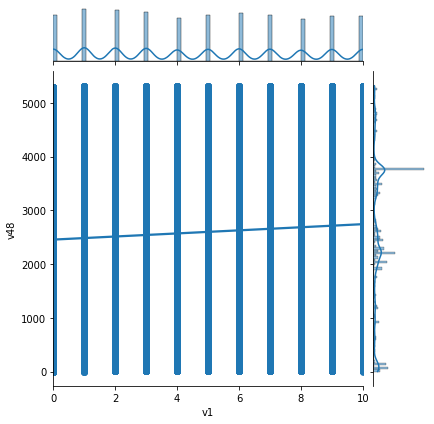

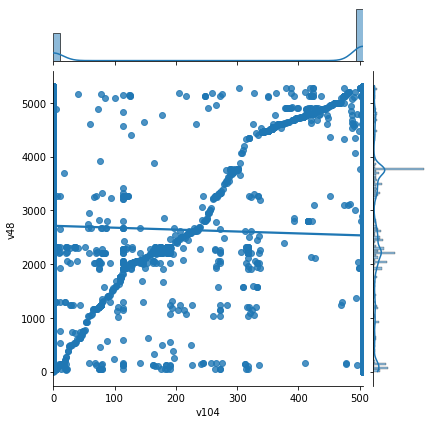

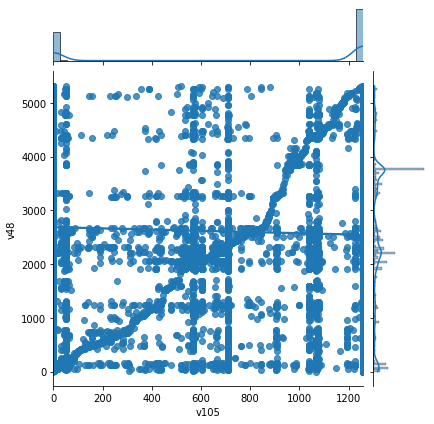

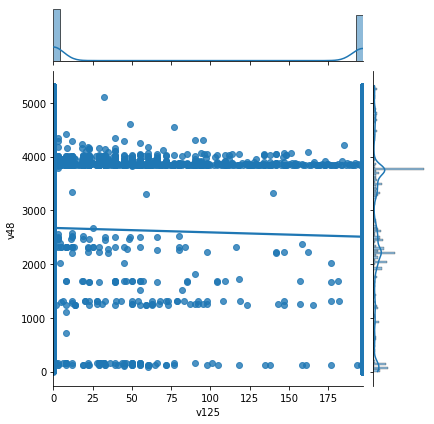

...

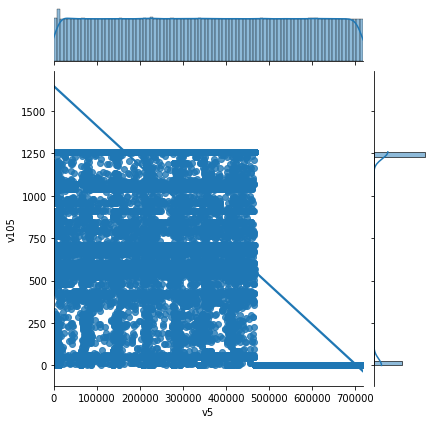

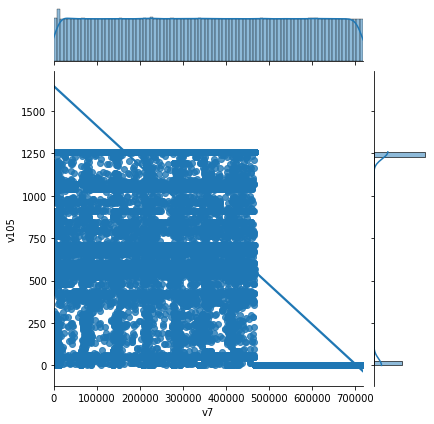

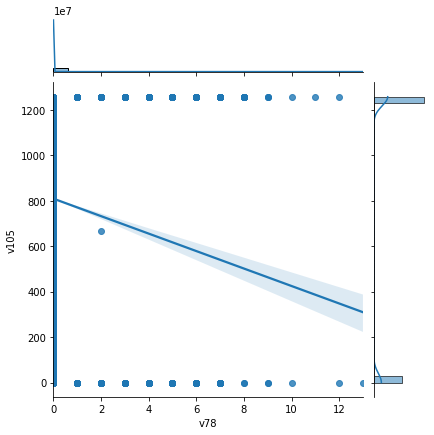

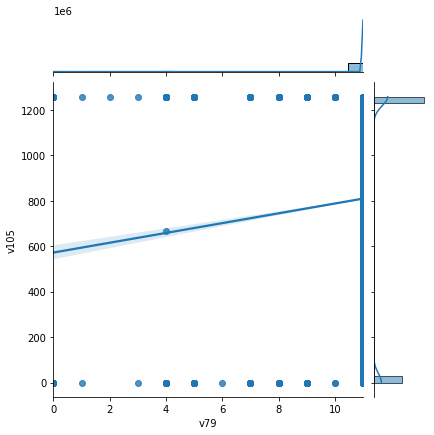

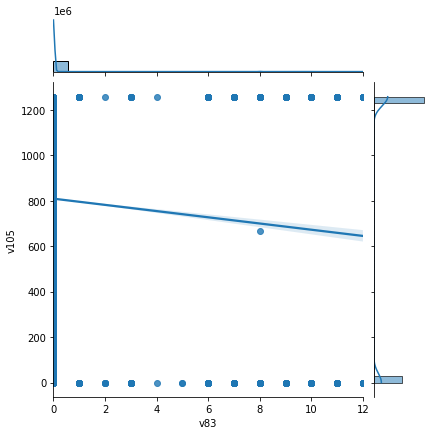

In [ ]:
plt.ioff()
g = sns.PairGrid(full2,x_vars = x_vars, y_vars=y_vars, palette='rocket')
g.map_diag(sns.histplot, kde=True)
g.map_offdiag(sns.jointplot, kind='reg')
#plt.savefig('/content/drive/MyDrive/zica/pairplotba01'+x_vars+y_vars+'.png',format = 'png',dpi=600)
plt.show();

###Fazendo o Q-Q Plot das Variáveis do Banco.



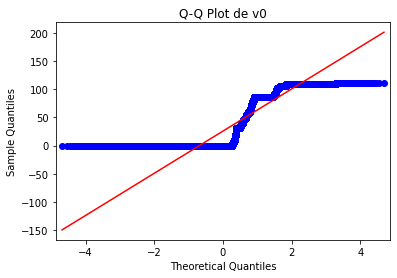

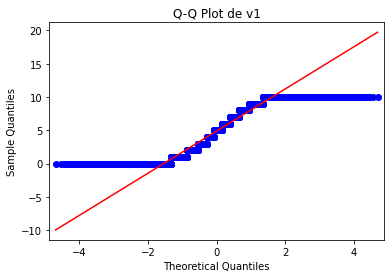

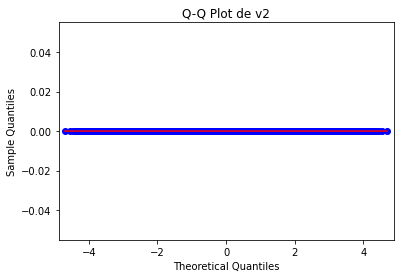

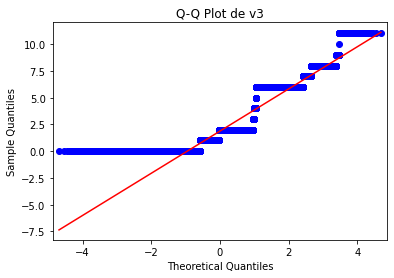

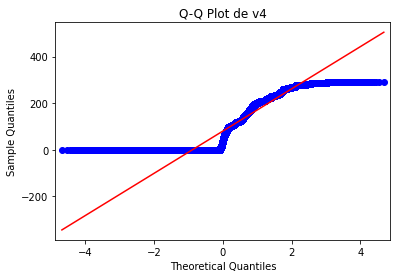

...

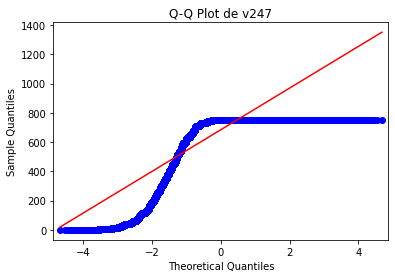

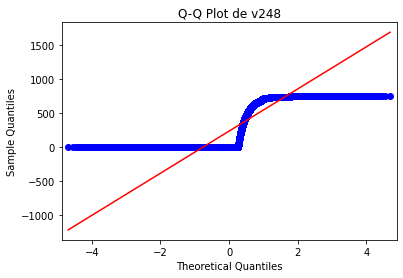

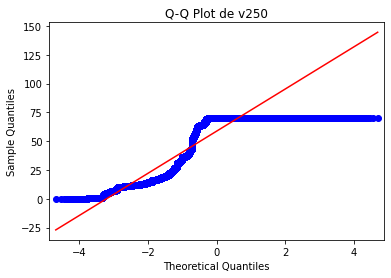

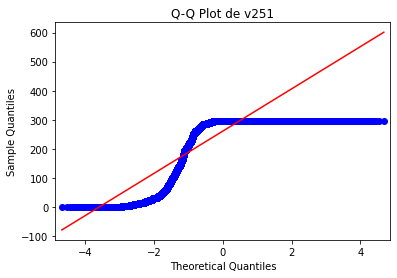

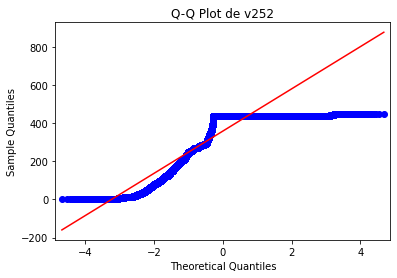

In [ ]:
plt.ioff()
for col in full2.columns:
  sm.qqplot(full2[col], line='s')
  plt.title('Q-Q Plot de ' + col)
  #plt.savefig('/content/drive/MyDrive/zica/qqplotgo'+ col +'.png',format='png',dpi=600)
  plt.show();

###Fazendo o Box Plot das Variáveis.

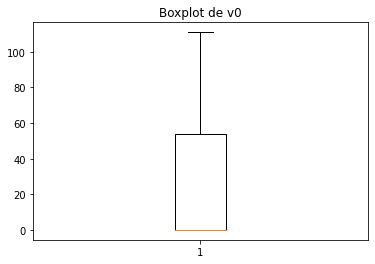

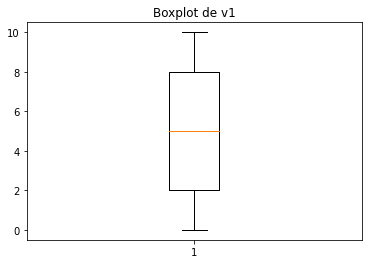

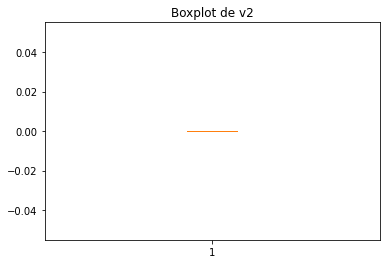

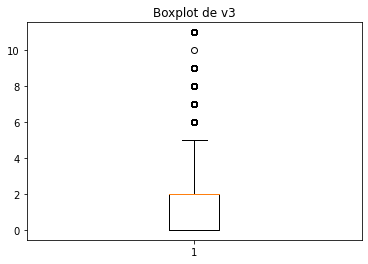

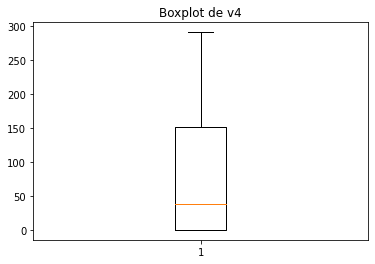

...

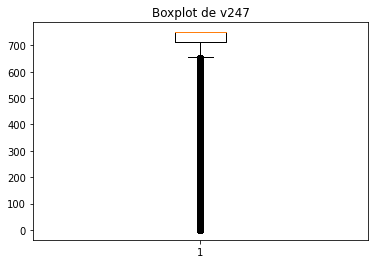

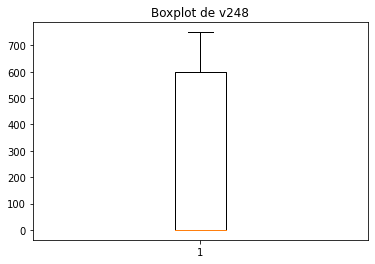

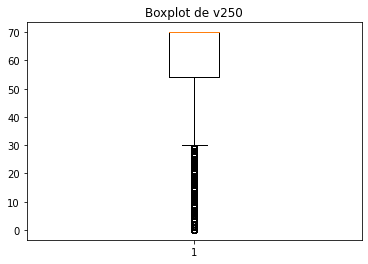

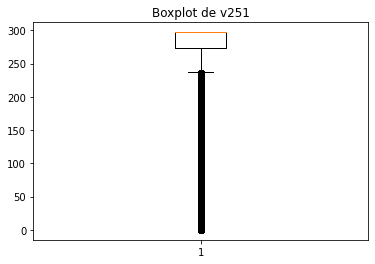

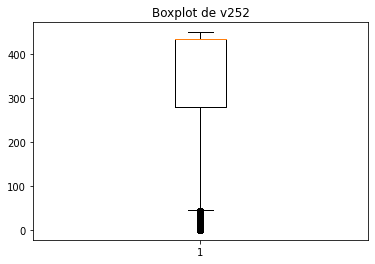

In [ ]:
plt.ioff()
for col in full2.columns:
  plt.boxplot(full2[col])
  plt.title('Boxplot de ' + col)
  #plt.savefig('/content/drive/MyDrive/zica/qqplotgo'+ col +'.png',format='png',dpi=600)
  plt.show();